# Importing libraries and datasets

In [1]:
#basic libraries
import pandas as pd
import numpy as np
import math

#visualisation
import matplotlib
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objs as go
import seaborn as sns
import missingno as msno
from plotly.figure_factory import create_scatterplotmatrix
from wordcloud import WordCloud
sns.set()

# Ignore warnings :
import warnings
warnings.filterwarnings('ignore')

# import required libraries for ML
import sklearn

#feature eng
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import LabelEncoder
import category_encoders as ce

#clustering
from sklearn.cluster import KMeans
from kneed import KneeLocator
from sklearn.cluster import DBSCAN
from itertools import product
from sklearn.metrics import silhouette_score

In [2]:
#datasets sales
sales = pd.read_csv("C:/Users/linco/Desktop/datastudy/DScourse/FinalProject/sales.csv")

In [3]:
sales.head()

,Unnamed: 0,OrderDate,StockDate,OrderNumber,ProductKey,ProductCategoryKey,CategoryName,ProductSubcategoryKey,SubcategoryName,ProductCost,...,Region,Country,Continent,OrderLineItem,OrderQuantity,OrderValue,OrderProfit,year,month,week
0,0,2015-01-01,9/21/2001,SO45080,332,1,Bikes,2,Road Bikes,413.1463,...,Northwest,United States,North America,1,1,699.0982,285.9519,2015,1,1
1,1,2015-01-01,12/5/2001,SO45079,312,1,Bikes,2,Road Bikes,2171.2942,...,Southwest,United States,North America,1,1,3578.2700,1406.9758,2015,1,1
2,2,2015-01-01,10/29/2001,SO45082,350,1,Bikes,1,Mountain Bikes,1898.0944,...,Australia,Australia,Pacific,1,1,3374.9900,1476.8956,2015,1,1
3,3,2015-01-01,11/16/2001,SO45081,338,1,Bikes,2,Road Bikes,413.1463,...,Canada,Canada,North America,1,1,699.0982,285.9519,2015,1,1
4,4,2015-01-02,12/15/2001,SO45083,312,1,Bikes,2,Road Bikes,2171.2942,...,United Kingdom,United Kingdom,Europe,1,1,3578.2700,1406.9758,2015,1,1


In [4]:
sales.drop(["Unnamed: 0"], axis=1, inplace=True)

In [5]:
sales.head()

,OrderDate,StockDate,OrderNumber,ProductKey,ProductCategoryKey,CategoryName,ProductSubcategoryKey,SubcategoryName,ProductCost,ProductPrice,...,Region,Country,Continent,OrderLineItem,OrderQuantity,OrderValue,OrderProfit,year,month,week
0,2015-01-01,9/21/2001,SO45080,332,1,Bikes,2,Road Bikes,413.1463,699.0982,...,Northwest,United States,North America,1,1,699.0982,285.9519,2015,1,1
1,2015-01-01,12/5/2001,SO45079,312,1,Bikes,2,Road Bikes,2171.2942,3578.2700,...,Southwest,United States,North America,1,1,3578.2700,1406.9758,2015,1,1
2,2015-01-01,10/29/2001,SO45082,350,1,Bikes,1,Mountain Bikes,1898.0944,3374.9900,...,Australia,Australia,Pacific,1,1,3374.9900,1476.8956,2015,1,1
3,2015-01-01,11/16/2001,SO45081,338,1,Bikes,2,Road Bikes,413.1463,699.0982,...,Canada,Canada,North America,1,1,699.0982,285.9519,2015,1,1
4,2015-01-02,12/15/2001,SO45083,312,1,Bikes,2,Road Bikes,2171.2942,3578.2700,...,United Kingdom,United Kingdom,Europe,1,1,3578.2700,1406.9758,2015,1,1


In [6]:
customers = pd.read_csv("C:/Users/linco/Desktop/datastudy/DScourse/FinalProject/customers.csv")

In [7]:
customers.head()

,Unnamed: 0,index,CustomerID,FirstName,LastName,AddressLine1,City,StateProvinceName,CountryRegionName,PostalCode,...,Education,Occupation,Gender,MaritalStatus,HomeOwnerFlag,NumberCarsOwned,NumberChildrenAtHome,TotalChildren,YearlyIncome,Age
0,0,0,11000,Jon,Yang,3761 N. 14th St,Rockhampton,Queensland,Australia,4700,...,Bachelors,Professional,M,M,1,0,0,2,137947,51.0
1,1,1,11001,Eugene,Huang,2243 W St.,Seaford,Victoria,Australia,3198,...,Bachelors,Professional,M,S,0,1,3,3,101141,52.0
2,2,2,11002,Ruben,Torres,5844 Linden Land,Hobart,Tasmania,Australia,7001,...,Bachelors,Professional,M,M,1,1,3,3,91945,51.0
3,3,3,11003,Christy,Zhu,1825 Village Pl.,North Ryde,New South Wales,Australia,2113,...,Bachelors,Professional,F,S,0,1,0,0,86688,49.0
4,4,4,11004,Elizabeth,Johnson,7553 Harness Circle,Wollongong,New South Wales,Australia,2500,...,Bachelors,Professional,F,S,1,4,5,5,92771,48.0


In [8]:
customers.drop(["Unnamed: 0","index"], axis=1, inplace=True)

In [9]:
customers.head()

,CustomerID,FirstName,LastName,AddressLine1,City,StateProvinceName,CountryRegionName,PostalCode,PhoneNumber,BirthDate,Education,Occupation,Gender,MaritalStatus,HomeOwnerFlag,NumberCarsOwned,NumberChildrenAtHome,TotalChildren,YearlyIncome,Age
0,11000,Jon,Yang,3761 N. 14th St,Rockhampton,Queensland,Australia,4700,1 (11) 500 555-0162,1966-04-08,Bachelors,Professional,M,M,1,0,0,2,137947,51.0
1,11001,Eugene,Huang,2243 W St.,Seaford,Victoria,Australia,3198,1 (11) 500 555-0110,1965-05-14,Bachelors,Professional,M,S,0,1,3,3,101141,52.0
2,11002,Ruben,Torres,5844 Linden Land,Hobart,Tasmania,Australia,7001,1 (11) 500 555-0184,1965-08-12,Bachelors,Professional,M,M,1,1,3,3,91945,51.0
3,11003,Christy,Zhu,1825 Village Pl.,North Ryde,New South Wales,Australia,2113,1 (11) 500 555-0162,1968-02-15,Bachelors,Professional,F,S,0,1,0,0,86688,49.0
4,11004,Elizabeth,Johnson,7553 Harness Circle,Wollongong,New South Wales,Australia,2500,1 (11) 500 555-0131,1968-08-08,Bachelors,Professional,F,S,1,4,5,5,92771,48.0


## checking datasets

In [10]:
sales.isnull().sum()

OrderDate                0
StockDate                0
OrderNumber              0
ProductKey               0
ProductCategoryKey       0
CategoryName             0
ProductSubcategoryKey    0
SubcategoryName          0
ProductCost              0
ProductPrice             0
CustomerKey              0
TerritoryKey             0
Region                   0
Country                  0
Continent                0
OrderLineItem            0
OrderQuantity            0
OrderValue               0
OrderProfit              0
year                     0
month                    0
week                     0
dtype: int64

In [11]:
sales.duplicated().sum()

0

In [12]:
customers.isnull().sum()

CustomerID              0
FirstName               0
LastName                0
AddressLine1            0
City                    0
StateProvinceName       0
CountryRegionName       0
PostalCode              0
PhoneNumber             0
BirthDate               0
Education               0
Occupation              0
Gender                  0
MaritalStatus           0
HomeOwnerFlag           0
NumberCarsOwned         0
NumberChildrenAtHome    0
TotalChildren           0
YearlyIncome            0
Age                     0
dtype: int64

In [13]:
customers.duplicated().sum()

0

## Outliers

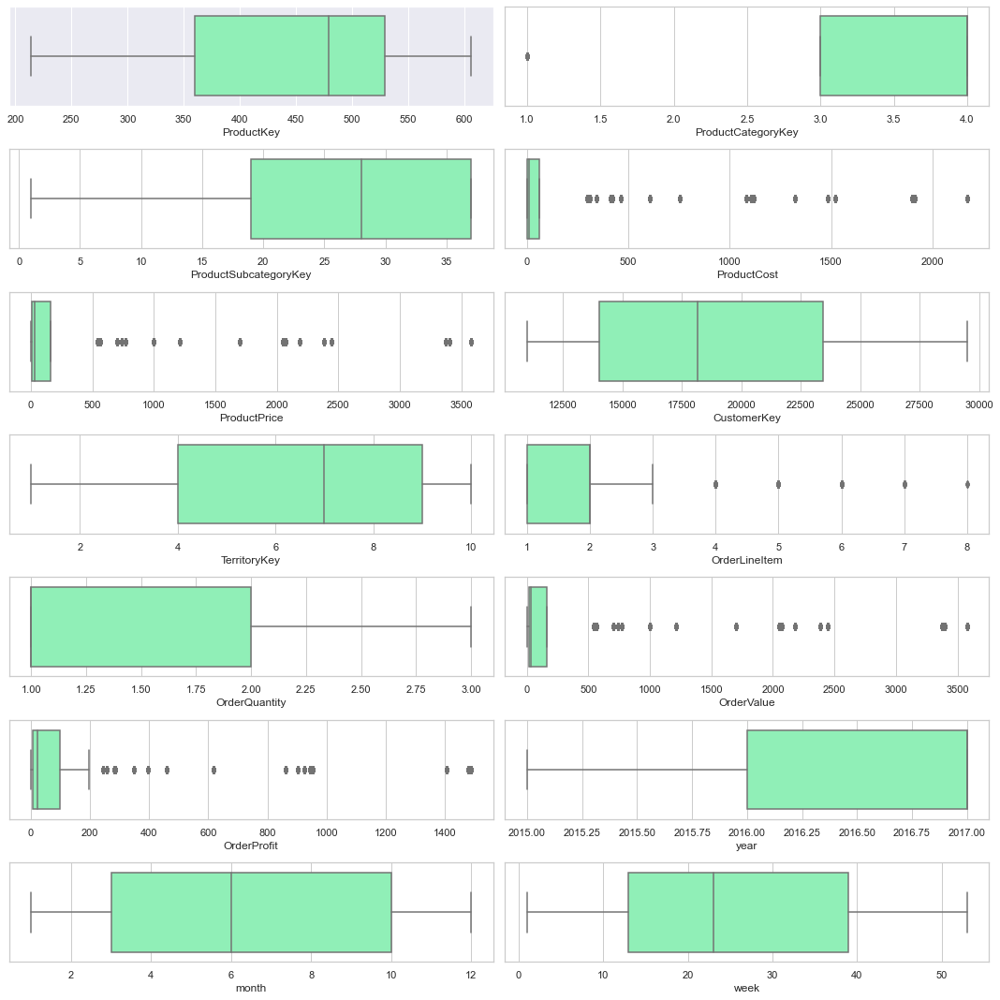

In [14]:
#boxplots to see outliers
data_columns = sales._get_numeric_data().columns.values
plot_columns = 2
number_of_columns = math.ceil(len(data_columns)/plot_columns)
number_of_rows = math.ceil((len(data_columns))/number_of_columns)

plt.figure(figsize=(15,15))
for i in range(0,len(data_columns)):
    plt.subplot(number_of_columns, number_of_rows, i+1)
    sns.set_style('whitegrid')
    sns.boxplot(sales[data_columns[i]],palette='rainbow')
    plt.tight_layout()

In [15]:
# the outliers are actual meaningful values from our sales so will keep them

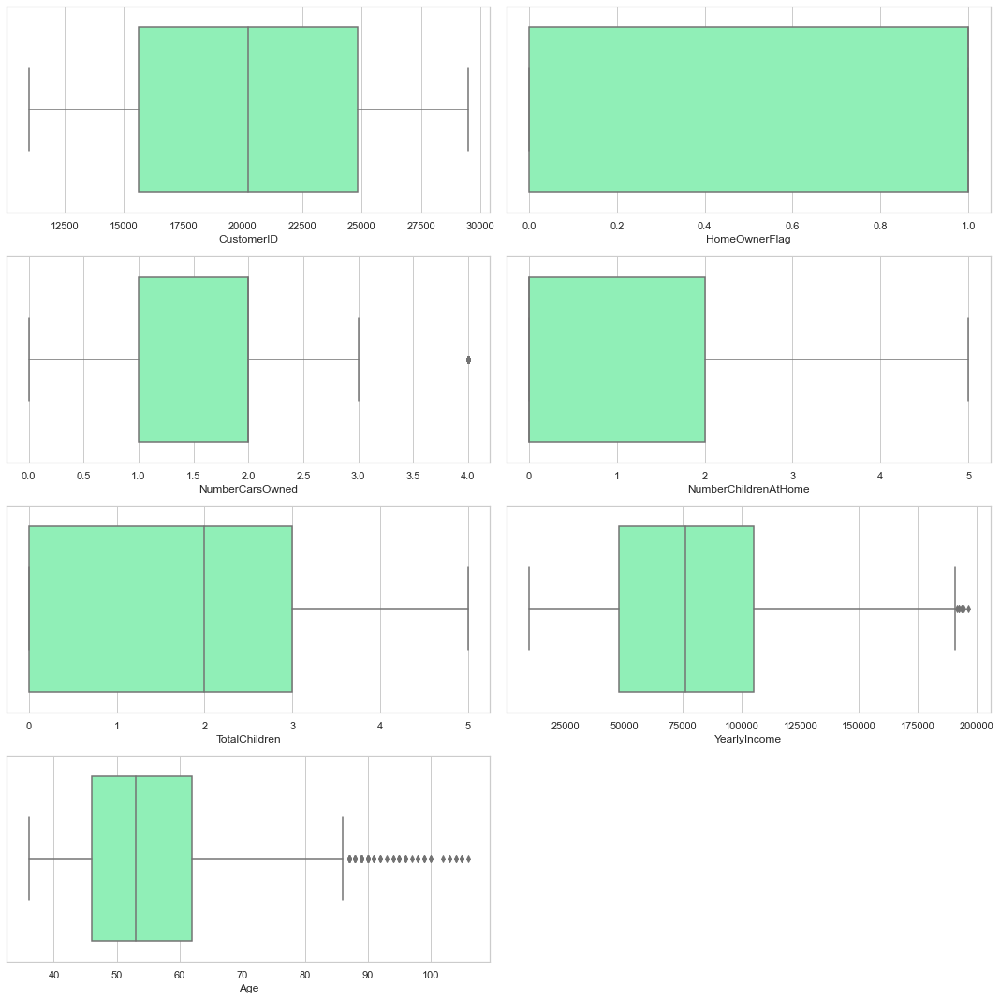

In [16]:
#boxplots to see outliers
data_columns = customers._get_numeric_data().columns.values
plot_columns = 2
number_of_columns = math.ceil(len(data_columns)/plot_columns)
number_of_rows = math.ceil((len(data_columns))/number_of_columns)

plt.figure(figsize=(15,15))
for i in range(0,len(data_columns)):
    plt.subplot(number_of_columns, number_of_rows, i+1)
    sns.set_style('whitegrid')
    sns.boxplot(customers[data_columns[i]],palette='rainbow')
    plt.tight_layout()

In [17]:
#checking customers old than 85
customers[customers["Age"]>85]

,CustomerID,FirstName,LastName,AddressLine1,City,StateProvinceName,CountryRegionName,PostalCode,PhoneNumber,BirthDate,Education,Occupation,Gender,MaritalStatus,HomeOwnerFlag,NumberCarsOwned,NumberChildrenAtHome,TotalChildren,YearlyIncome,Age
460,11503,Dennis,Wu,9810 Rishell Ct.,Coronado,California,United States,92118,724-555-0194,1930-10-13,Graduate Degree,Skilled Manual,M,M,1,0,0,1,66443,86.0
461,11504,Jordan,Baker,3427 B Wildbrook Ct.,Downey,California,United States,90241,138-555-0117,1931-04-20,Bachelors,Skilled Manual,F,M,1,1,0,1,58099,86.0
505,11554,Sydney,Simmons,"88, avenue de l´ Union Centrale",Tremblay-en-France,Seine Saint Denis,France,93290,1 (11) 500 555-0198,1926-09-28,High School,Manual,F,S,1,2,0,4,15686,90.0
506,11555,Alexandria,Henderson,"11, rue de la Cavalerie",Esher-Molesey,England,United Kingdom,EM15,1 (11) 500 555-0182,1926-07-08,Bachelors,Clerical,F,M,1,0,0,1,55981,90.0
766,11845,Natalie,Jones,1442 Hill Top Rd,Shawnee,British Columbia,Canada,V8Z 4N5,119-555-0148,1924-08-18,High School,Skilled Manual,F,S,0,2,0,2,42600,92.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15580,28537,Christian,Hayes,4631 Candlestick Drive,Brisbane,Queensland,Australia,4000,1 (11) 500 555-0162,1926-07-16,Bachelors,Professional,M,S,0,1,0,1,70877,90.0
15763,28743,Kelly,Wood,"21, rue du Départ",Paris,Seine (Paris),France,75007,1 (11) 500 555-0164,1915-05-18,Partial High School,Manual,F,S,0,2,0,2,21924,102.0
16154,29177,Frank,Martin,3448 Concord,Chula Vista,California,United States,91910,730-555-0167,1929-11-06,Graduate Degree,Management,M,M,1,1,0,3,109834,87.0
16324,29370,Mason,Kelly,Zeiter Weg 9563,Bottrop,Nordrhein-Westfalen,Germany,46236,1 (11) 500 555-0173,1927-10-18,Bachelors,Clerical,M,S,0,1,0,1,59924,89.0


In [18]:
customers[customers["Age"]>85].count()

CustomerID              84
FirstName               84
LastName                84
AddressLine1            84
City                    84
StateProvinceName       84
CountryRegionName       84
PostalCode              84
PhoneNumber             84
BirthDate               84
Education               84
Occupation              84
Gender                  84
MaritalStatus           84
HomeOwnerFlag           84
NumberCarsOwned         84
NumberChildrenAtHome    84
TotalChildren           84
YearlyIncome            84
Age                     84
dtype: int64

In [19]:
customers[customers["Age"]>100].count()

CustomerID              9
FirstName               9
LastName                9
AddressLine1            9
City                    9
StateProvinceName       9
CountryRegionName       9
PostalCode              9
PhoneNumber             9
BirthDate               9
Education               9
Occupation              9
Gender                  9
MaritalStatus           9
HomeOwnerFlag           9
NumberCarsOwned         9
NumberChildrenAtHome    9
TotalChildren           9
YearlyIncome            9
Age                     9
dtype: int64

In [20]:
customers.shape

(16921, 20)

In [21]:
#dropping customers with suspicous age of over 85
customers = customers[customers["Age"]<=85]

In [22]:
customers[customers["Age"]>85].count()

CustomerID              0
FirstName               0
LastName                0
AddressLine1            0
City                    0
StateProvinceName       0
CountryRegionName       0
PostalCode              0
PhoneNumber             0
BirthDate               0
Education               0
Occupation              0
Gender                  0
MaritalStatus           0
HomeOwnerFlag           0
NumberCarsOwned         0
NumberChildrenAtHome    0
TotalChildren           0
YearlyIncome            0
Age                     0
dtype: int64

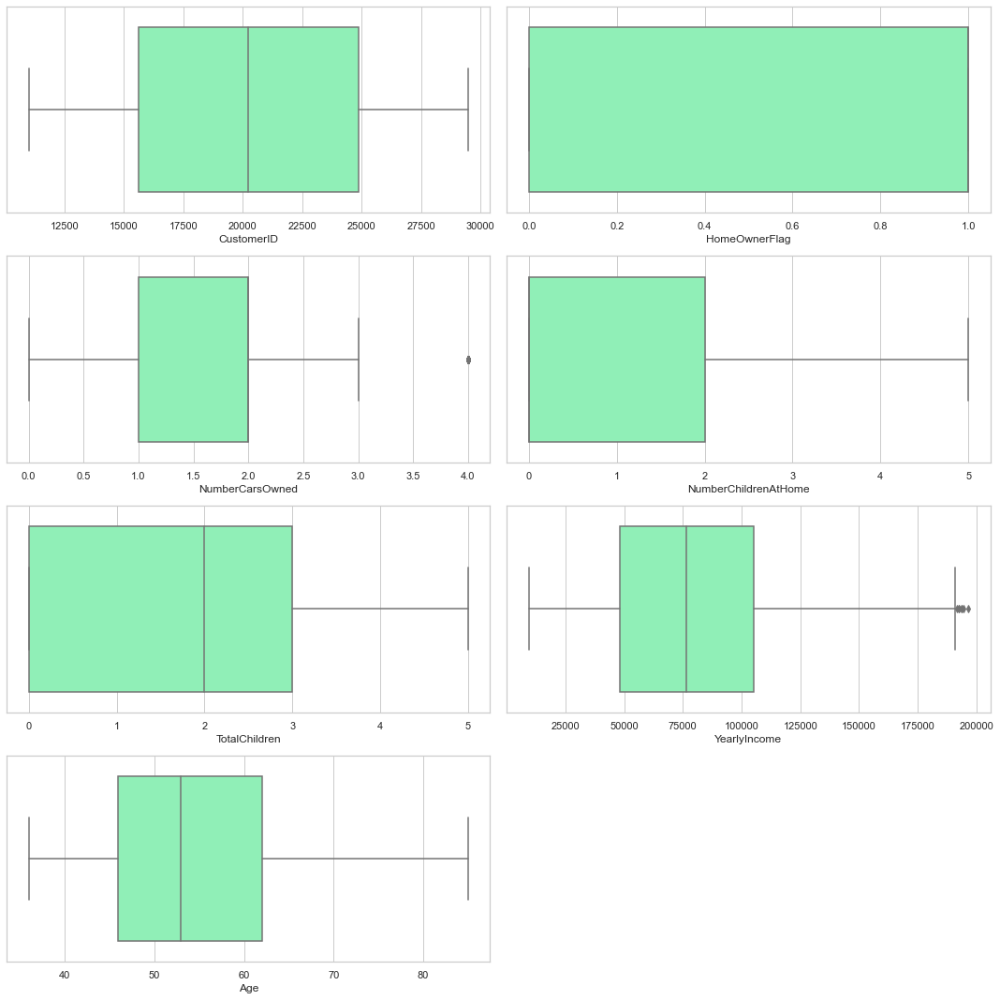

In [23]:
# re doing boxplots to see outliers
data_columns = customers._get_numeric_data().columns.values
plot_columns = 2
number_of_columns = math.ceil(len(data_columns)/plot_columns)
number_of_rows = math.ceil((len(data_columns))/number_of_columns)

plt.figure(figsize=(15,15))
for i in range(0,len(data_columns)):
    plt.subplot(number_of_columns, number_of_rows, i+1)
    sns.set_style('whitegrid')
    sns.boxplot(customers[data_columns[i]],palette='rainbow')
    plt.tight_layout()

# Spending Behaviour Segmentation - RFM Clustering

## Data Prep

In [24]:
sales.columns # have everything in this dataset for RFM 

Index(['OrderDate', 'StockDate', 'OrderNumber', 'ProductKey',
       'ProductCategoryKey', 'CategoryName', 'ProductSubcategoryKey',
       'SubcategoryName', 'ProductCost', 'ProductPrice', 'CustomerKey',
       'TerritoryKey', 'Region', 'Country', 'Continent', 'OrderLineItem',
       'OrderQuantity', 'OrderValue', 'OrderProfit', 'year', 'month', 'week'],
      dtype='object')

In [25]:
sales.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 56046 entries, 0 to 56045
Data columns (total 22 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   OrderDate              56046 non-null  object 
 1   StockDate              56046 non-null  object 
 2   OrderNumber            56046 non-null  object 
 3   ProductKey             56046 non-null  int64  
 4   ProductCategoryKey     56046 non-null  int64  
 5   CategoryName           56046 non-null  object 
 6   ProductSubcategoryKey  56046 non-null  int64  
 7   SubcategoryName        56046 non-null  object 
 8   ProductCost            56046 non-null  float64
 9   ProductPrice           56046 non-null  float64
 10  CustomerKey            56046 non-null  int64  
 11  TerritoryKey           56046 non-null  int64  
 12  Region                 56046 non-null  object 
 13  Country                56046 non-null  object 
 14  Continent              56046 non-null  object 
 15  Or

## Recency

In [26]:
sales["OrderDate"] = pd.to_datetime(sales["OrderDate"])

In [27]:
sales.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 56046 entries, 0 to 56045
Data columns (total 22 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   OrderDate              56046 non-null  datetime64[ns]
 1   StockDate              56046 non-null  object        
 2   OrderNumber            56046 non-null  object        
 3   ProductKey             56046 non-null  int64         
 4   ProductCategoryKey     56046 non-null  int64         
 5   CategoryName           56046 non-null  object        
 6   ProductSubcategoryKey  56046 non-null  int64         
 7   SubcategoryName        56046 non-null  object        
 8   ProductCost            56046 non-null  float64       
 9   ProductPrice           56046 non-null  float64       
 10  CustomerKey            56046 non-null  int64         
 11  TerritoryKey           56046 non-null  int64         
 12  Region                 56046 non-null  object        
 13  C

In [28]:
end_date = sales["OrderDate"].max()

In [29]:
end_date

Timestamp('2017-06-30 00:00:00')

In [30]:
sales["difference"] = end_date - sales["OrderDate"]

In [31]:
sales.head()

,OrderDate,StockDate,OrderNumber,ProductKey,ProductCategoryKey,CategoryName,ProductSubcategoryKey,SubcategoryName,ProductCost,ProductPrice,...,Country,Continent,OrderLineItem,OrderQuantity,OrderValue,OrderProfit,year,month,week,difference
0,2015-01-01,9/21/2001,SO45080,332,1,Bikes,2,Road Bikes,413.1463,699.0982,...,United States,North America,1,1,699.0982,285.9519,2015,1,1,911 days
1,2015-01-01,12/5/2001,SO45079,312,1,Bikes,2,Road Bikes,2171.2942,3578.2700,...,United States,North America,1,1,3578.2700,1406.9758,2015,1,1,911 days
2,2015-01-01,10/29/2001,SO45082,350,1,Bikes,1,Mountain Bikes,1898.0944,3374.9900,...,Australia,Pacific,1,1,3374.9900,1476.8956,2015,1,1,911 days
3,2015-01-01,11/16/2001,SO45081,338,1,Bikes,2,Road Bikes,413.1463,699.0982,...,Canada,North America,1,1,699.0982,285.9519,2015,1,1,911 days
4,2015-01-02,12/15/2001,SO45083,312,1,Bikes,2,Road Bikes,2171.2942,3578.2700,...,United Kingdom,Europe,1,1,3578.2700,1406.9758,2015,1,1,910 days


In [32]:
sales.columns

Index(['OrderDate', 'StockDate', 'OrderNumber', 'ProductKey',
       'ProductCategoryKey', 'CategoryName', 'ProductSubcategoryKey',
       'SubcategoryName', 'ProductCost', 'ProductPrice', 'CustomerKey',
       'TerritoryKey', 'Region', 'Country', 'Continent', 'OrderLineItem',
       'OrderQuantity', 'OrderValue', 'OrderProfit', 'year', 'month', 'week',
       'difference'],
      dtype='object')

In [33]:
RFMrec = sales.groupby("CustomerKey")["difference"].min()
RFMrec

CustomerKey
11000   238 days
11001    18 days
11002   307 days
11003   231 days
11004   240 days
          ...   
29479   479 days
29480   163 days
29481   868 days
29482   465 days
29483   474 days
Name: difference, Length: 17416, dtype: timedelta64[ns]

In [34]:
RFMrec.sort_values(ascending=True, inplace=True)
RFMrec

CustomerKey
19331     0 days
11877     0 days
22726     0 days
15615     0 days
22202     0 days
          ...   
29140   906 days
29151   908 days
29170   909 days
29143   910 days
26782   911 days
Name: difference, Length: 17416, dtype: timedelta64[ns]

In [35]:
RFMrec = RFMrec.reset_index()
RFMrec.head()

,CustomerKey,difference
0,19331,0 days
1,11877,0 days
2,22726,0 days
3,15615,0 days
4,22202,0 days


In [36]:
#extract number of days 

RFMrec["difference"] = RFMrec["difference"].dt.days

In [37]:
RFMrec

,CustomerKey,difference
0,19331,0
1,11877,0
2,22726,0
3,15615,0
4,22202,0
...,...,...
17411,29140,906
17412,29151,908
17413,29170,909
17414,29143,910


In [38]:
RFMrec.rename(columns={"difference":"Recency"}, inplace=True)
RFMrec

,CustomerKey,Recency
0,19331,0
1,11877,0
2,22726,0
3,15615,0
4,22202,0
...,...,...
17411,29140,906
17412,29151,908
17413,29170,909
17414,29143,910


## Frequency

In [39]:
sales.columns

Index(['OrderDate', 'StockDate', 'OrderNumber', 'ProductKey',
       'ProductCategoryKey', 'CategoryName', 'ProductSubcategoryKey',
       'SubcategoryName', 'ProductCost', 'ProductPrice', 'CustomerKey',
       'TerritoryKey', 'Region', 'Country', 'Continent', 'OrderLineItem',
       'OrderQuantity', 'OrderValue', 'OrderProfit', 'year', 'month', 'week',
       'difference'],
      dtype='object')

In [40]:
RFMfreq = sales.groupby("CustomerKey")["OrderNumber"].count()

In [41]:
RFMfreq

CustomerKey
11000     7
11001    10
11002     3
11003     8
11004     5
         ..
29479     1
29480     5
29481     1
29482     1
29483     1
Name: OrderNumber, Length: 17416, dtype: int64

In [42]:
RFMfreq = RFMfreq.reset_index()
RFMfreq

,CustomerKey,OrderNumber
0,11000,7
1,11001,10
2,11002,3
3,11003,8
4,11004,5
...,...,...
17411,29479,1
17412,29480,5
17413,29481,1
17414,29482,1


In [43]:
RFMfreq.rename(columns={"OrderNumber":"Frequency"}, inplace=True)
RFMfreq

,CustomerKey,Frequency
0,11000,7
1,11001,10
2,11002,3
3,11003,8
4,11004,5
...,...,...
17411,29479,1
17412,29480,5
17413,29481,1
17414,29482,1


## Monetary

amount of money spent by the customer in this sales period

In [44]:
sales[["OrderValue"]]

,OrderValue
0,699.0982
1,3578.2700
2,3374.9900
3,699.0982
4,3578.2700
...,...
56041,9.9800
56042,8.9900
56043,539.9900
56044,4.5800


In [45]:
RFMmon = sales.groupby("CustomerKey")["OrderValue"].sum()
RFMmon.head()

CustomerKey
11000    4656.3896
11001    2821.2122
11002    4466.8124
11003    4532.9866
11004    4568.0838
Name: OrderValue, dtype: float64

In [46]:
RFMmon.sort_values(ascending=True, inplace=True)
RFMmon

CustomerKey
18304        2.2900
11209        2.2900
28093        2.2900
28016        2.2900
20141        3.9900
            ...    
11420    11022.4002
11417    11085.7504
11241    11330.4494
11439    12015.4029
11433    12407.9545
Name: OrderValue, Length: 17416, dtype: float64

In [47]:
RFMmon = RFMmon.reset_index()

In [48]:
RFMmon

,CustomerKey,OrderValue
0,18304,2.2900
1,11209,2.2900
2,28093,2.2900
3,28016,2.2900
4,20141,3.9900
...,...,...
17411,11420,11022.4002
17412,11417,11085.7504
17413,11241,11330.4494
17414,11439,12015.4029


In [49]:
RFMmon["Monetary"] = round(RFMmon["OrderValue"],2)
RFMmon.drop(["OrderValue"], axis=1, inplace=True)
RFMmon.head()

,CustomerKey,Monetary
0,18304,2.29
1,11209,2.29
2,28093,2.29
3,28016,2.29
4,20141,3.99


## RFM df

In [50]:
RFM = pd.merge(RFMrec, RFMfreq, on="CustomerKey", how="outer")
RFM

,CustomerKey,Recency,Frequency
0,19331,0,2
1,11877,0,2
2,22726,0,1
3,15615,0,7
4,22202,0,6
...,...,...,...
17411,29140,906,1
17412,29151,908,1
17413,29170,909,1
17414,29143,910,1


In [51]:
RFM = pd.merge(RFM, RFMmon, on="CustomerKey", how="outer")
RFM

,CustomerKey,Recency,Frequency,Monetary
0,19331,0,2,28.98
1,11877,0,2,58.85
2,22726,0,1,59.98
3,15615,0,7,96.49
4,22202,0,6,4426.48
...,...,...,...,...
17411,29140,906,1,3578.27
17412,29151,908,1,3578.27
17413,29170,909,1,3578.27
17414,29143,910,1,3578.27


In [52]:
RFM.isnull().sum()

CustomerKey    0
Recency        0
Frequency      0
Monetary       0
dtype: int64

In [53]:
RFM.duplicated().sum()

0

In [54]:
RFM.set_index("CustomerKey", inplace=True)

In [55]:
RFM.head()

,Recency,Frequency,Monetary
CustomerKey,,,
19331,0,2,28.98
11877,0,2,58.85
22726,0,1,59.98
15615,0,7,96.49
22202,0,6,4426.48


In [56]:
RFM.describe()

,Recency,Frequency,Monetary
count,17416.000000,17416.000000,17416.000000
mean,158.137345,3.218075,1430.557211
std,118.267734,2.487335,1886.765616
min,0.000000,1.000000,2.290000
25%,64.000000,2.000000,69.990000
50%,143.000000,3.000000,539.990000
75%,233.000000,4.000000,2256.652500
max,911.000000,64.000000,12407.950000


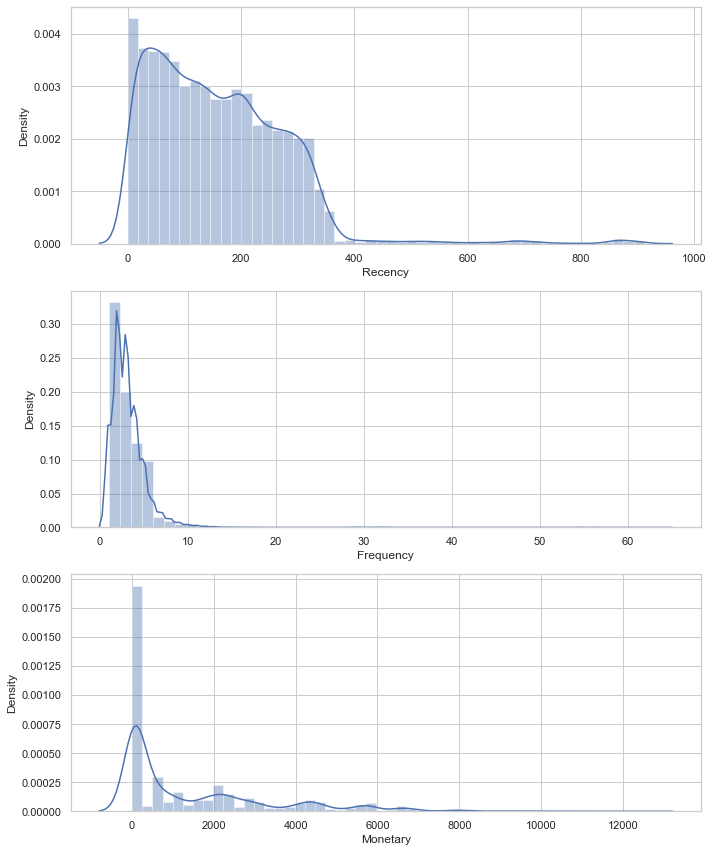

In [57]:
# plot the distribution of RFM values
plt.subplots(figsize=(10, 12))

plt.subplot(3, 1, 1)
sns.distplot(RFM.Recency, label = 'Recency')

plt.subplot(3, 1, 2)
sns.distplot(RFM.Frequency, label = 'Frequency')

plt.subplot(3, 1, 3)
sns.distplot(RFM.Monetary, label = 'Monetary Value')

plt.tight_layout()
plt.show()

## Feature engineering

### Log

In [58]:
# all 3 variables are highly left skewed and we have zeros so will use log1p transformation to correct

In [59]:
rfm_log = RFM[['Recency', 'Frequency', 'Monetary']].apply(np.log1p, axis = 1).round(2)
rfm_log

,Recency,Frequency,Monetary
CustomerKey,,,
19331,0.00,1.10,3.40
11877,0.00,1.10,4.09
22726,0.00,0.69,4.11
15615,0.00,2.08,4.58
22202,0.00,1.95,8.40
...,...,...,...
29140,6.81,0.69,8.18
29151,6.81,0.69,8.18
29170,6.81,0.69,8.18


In [60]:
rfm_log.isnull().sum()

Recency      0
Frequency    0
Monetary     0
dtype: int64

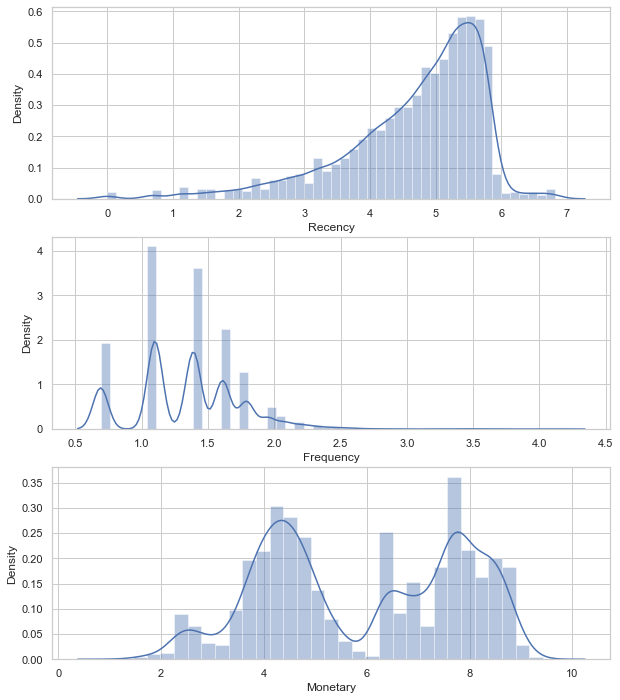

In [61]:
# plot the distribution of RFM values
plt.subplots(figsize=(10, 12))

plt.subplot(3, 1, 1)
sns.distplot(rfm_log.Recency, label = 'Recency')

plt.subplot(3, 1, 2)
sns.distplot(rfm_log.Frequency, label = 'Frequency')

plt.subplot(3, 1, 3)
sns.distplot(rfm_log.Monetary, label = 'Monetary Value')

plt.show()

### Scaling

In [62]:
#initialise the scaler
mmscaler = MinMaxScaler()

In [63]:
rfm_log

,Recency,Frequency,Monetary
CustomerKey,,,
19331,0.00,1.10,3.40
11877,0.00,1.10,4.09
22726,0.00,0.69,4.11
15615,0.00,2.08,4.58
22202,0.00,1.95,8.40
...,...,...,...
29140,6.81,0.69,8.18
29151,6.81,0.69,8.18
29170,6.81,0.69,8.18


In [64]:
rfm_scaled = mmscaler.fit_transform(rfm_log)

In [65]:
rfm_scaled

array([[0.        , 0.11781609, 0.26820388],
       [0.        , 0.11781609, 0.35194175],
       [0.        , 0.        , 0.35436893],
       ...,
       [0.99853372, 0.        , 0.84830097],
       [0.99853372, 0.        , 0.84830097],
       [1.        , 0.        , 0.65048544]])

In [66]:
rfm_scaled = pd.DataFrame(rfm_scaled)

In [67]:
rfm_scaled

,0,1,2
0,0.000000,0.117816,0.268204
1,0.000000,0.117816,0.351942
2,0.000000,0.000000,0.354369
3,0.000000,0.399425,0.411408
4,0.000000,0.362069,0.875000
...,...,...,...
17411,0.998534,0.000000,0.848301
17412,0.998534,0.000000,0.848301
17413,0.998534,0.000000,0.848301
17414,0.998534,0.000000,0.848301


In [68]:
rfm_scaled.columns = ["Recency", "Frequency", "Monetary"]

In [69]:
rfm_scaled

,Recency,Frequency,Monetary
0,0.000000,0.117816,0.268204
1,0.000000,0.117816,0.351942
2,0.000000,0.000000,0.354369
3,0.000000,0.399425,0.411408
4,0.000000,0.362069,0.875000
...,...,...,...
17411,0.998534,0.000000,0.848301
17412,0.998534,0.000000,0.848301
17413,0.998534,0.000000,0.848301
17414,0.998534,0.000000,0.848301


## K Means

In [70]:
# prepare for the model
inertia = []

ks= range(1,20)

In [71]:
#get the best ks

for i in ks:
    kmeans= KMeans(n_clusters=i, random_state=7)
    kmeans.fit(rfm_scaled)
    inertia.append(kmeans.inertia_)

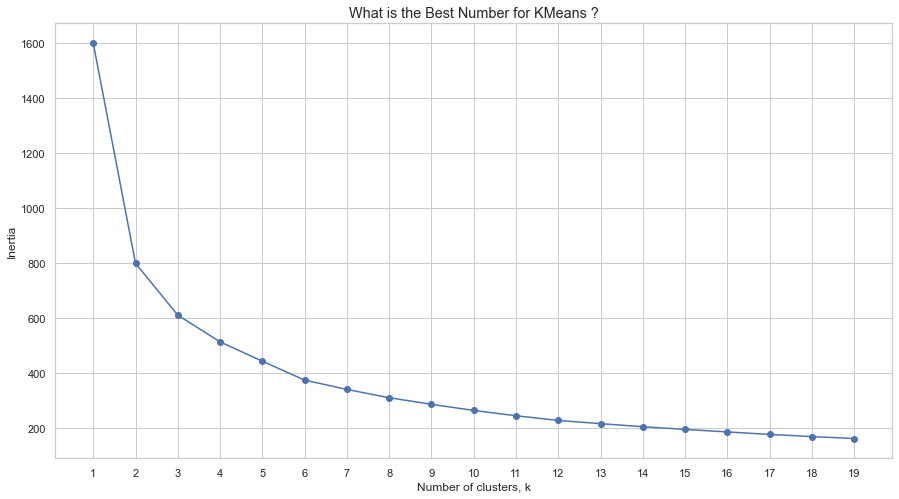

In [72]:
#plot ks vs inertias
f, ax = plt.subplots(figsize=(15, 8))
plt.plot(ks, inertia, '-o')

plt.xlabel('Number of clusters, k')
plt.ylabel('Inertia')
plt.xticks(ks)
plt.style.use('ggplot')
plt.title('What is the Best Number for KMeans ?')
plt.show()

In [73]:
# find elbow point 
kl = KneeLocator(ks, inertia, curve="convex", direction="decreasing")
kl

In [74]:
print("Elbow point: ", kl.elbow)

Elbow point:  4


In [75]:
# build the model with 4 clusters

kmeans = KMeans(n_clusters=4, max_iter=500, random_state=66)

kmeans.fit(rfm_scaled)

KMeans(max_iter=500, n_clusters=4, random_state=66)

In [76]:
#assign the clusters IDs to the scaled data
rfm_scaled["ClusterID"] = kmeans.labels_
rfm_scaled

,Recency,Frequency,Monetary,ClusterID
0,0.000000,0.117816,0.268204,2
1,0.000000,0.117816,0.351942,2
2,0.000000,0.000000,0.354369,2
3,0.000000,0.399425,0.411408,2
4,0.000000,0.362069,0.875000,0
...,...,...,...,...
17411,0.998534,0.000000,0.848301,3
17412,0.998534,0.000000,0.848301,3
17413,0.998534,0.000000,0.848301,3
17414,0.998534,0.000000,0.848301,3


In [77]:
#customers per cluster
rfm_scaled["ClusterID"].value_counts()

1    6362
3    6328
0    2571
2    2155
Name: ClusterID, dtype: int64

In [78]:
RFM

,Recency,Frequency,Monetary
CustomerKey,,,
19331,0,2,28.98
11877,0,2,58.85
22726,0,1,59.98
15615,0,7,96.49
22202,0,6,4426.48
...,...,...,...
29140,906,1,3578.27
29151,908,1,3578.27
29170,909,1,3578.27


In [79]:
RFM.reset_index(inplace=True)

In [80]:
RFM

,CustomerKey,Recency,Frequency,Monetary
0,19331,0,2,28.98
1,11877,0,2,58.85
2,22726,0,1,59.98
3,15615,0,7,96.49
4,22202,0,6,4426.48
...,...,...,...,...
17411,29140,906,1,3578.27
17412,29151,908,1,3578.27
17413,29170,909,1,3578.27
17414,29143,910,1,3578.27


In [81]:
#assign the cluster IDs to the not scaled data

RFM["ClusterID"] = kmeans.labels_
RFM

,CustomerKey,Recency,Frequency,Monetary,ClusterID
0,19331,0,2,28.98,2
1,11877,0,2,58.85,2
2,22726,0,1,59.98,2
3,15615,0,7,96.49,2
4,22202,0,6,4426.48,0
...,...,...,...,...,...
17411,29140,906,1,3578.27,3
17412,29151,908,1,3578.27,3
17413,29170,909,1,3578.27,3
17414,29143,910,1,3578.27,3


In [82]:
#checking it's all good
RFM["ClusterID"].value_counts()

1    6362
3    6328
0    2571
2    2155
Name: ClusterID, dtype: int64

## Visualising the Clusters - unscaled data

### Scatter plots

In [83]:
colors = ["Coral", "Olive", "DarkSeaGreen", "skyblue"]

In [84]:
#Recency vs Frequency

fig = px.scatter(RFM, x="Recency", y="Frequency", 
                 color="ClusterID", color_continuous_scale=colors)
fig.update_layout(coloraxis_showscale=False)
fig.show()

In [85]:
#Recency vs Monetary

fig = px.scatter(RFM, x="Recency", y="Monetary", 
                 color="ClusterID", color_continuous_scale=colors)
fig.update_layout(coloraxis_showscale=False)
fig.update_layout(coloraxis_showscale=False)
fig.update_layout(plot_bgcolor = "white")
fig.show()

In [86]:
# Frequency vs Monetary

fig = px.scatter(RFM, x="Frequency", y="Monetary", 
                 color="ClusterID", color_continuous_scale=colors)
fig.update_layout(coloraxis_showscale=False)
fig.show()

In [88]:
# all together

fig = px.scatter_3d(RFM, x="Recency", y="Monetary", z="Frequency",  
                 color="ClusterID", color_continuous_scale=colors)
fig.update_layout(coloraxis_showscale=False)
fig.show()
fig.write_html("file.html")

### Bar plots

In [89]:
#calculate means per cluster per RFM measure
mean_clusters = RFM.groupby("ClusterID").mean().reset_index()
mean_clusters

,ClusterID,CustomerKey,Recency,Frequency,Monetary
0,0,19350.411513,34.140023,4.712952,2889.445974
1,1,20682.769255,194.432883,2.434612,72.895641
2,2,19098.460325,36.685847,3.306265,110.333680
3,3,20250.495417,213.385904,3.368363,2652.384267


In [90]:
mean_clusters.drop(["CustomerKey"], axis=1, inplace=True)

In [91]:
mean_clusters

,ClusterID,Recency,Frequency,Monetary
0,0,34.140023,4.712952,2889.445974
1,1,194.432883,2.434612,72.895641
2,2,36.685847,3.306265,110.333680
3,3,213.385904,3.368363,2652.384267


In [92]:
# Recency bar plot

fig = px.bar(mean_clusters, x="ClusterID", y="Recency",
            color="ClusterID", color_continuous_scale=colors)
fig.update_layout(barmode="group")
fig.show()

In [93]:
# Frequency bar plot

fig = px.bar(mean_clusters, x="ClusterID", y="Frequency",
            color="ClusterID", color_continuous_scale=colors)
fig.update_layout(barmode="group")
fig.show()

In [94]:
# Monetary Value bar plot

fig = px.bar(mean_clusters, x="ClusterID", y="Monetary",
            color="ClusterID", color_continuous_scale=colors)
fig.update_layout(barmode="group")
fig.show()

## Visualising the cluster - scaled data

In [95]:
#Recency vs Frequency

fig = px.scatter(rfm_scaled, x="Recency", y="Frequency", 
                 color="ClusterID", color_continuous_scale=colors)
fig.update_layout(coloraxis_showscale=False)
fig.show()

In [96]:
#Recency vs Monetary
fig = px.scatter(rfm_scaled, x="Recency", y="Monetary", 
                 color="ClusterID", color_continuous_scale=colors)
fig.update_layout(coloraxis_showscale=False)
fig.update_layout(plot_bgcolor = "white")
fig.show()

In [97]:
# Frequency vs Monetary

fig = px.scatter(rfm_scaled, x="Frequency", y="Monetary", 
                 color="ClusterID", color_continuous_scale=colors)
fig.update_layout(coloraxis_showscale=False)
fig.show()

# Demographic Segmentation

In [98]:
customers.head()

,CustomerID,FirstName,LastName,AddressLine1,City,StateProvinceName,CountryRegionName,PostalCode,PhoneNumber,BirthDate,Education,Occupation,Gender,MaritalStatus,HomeOwnerFlag,NumberCarsOwned,NumberChildrenAtHome,TotalChildren,YearlyIncome,Age
0,11000,Jon,Yang,3761 N. 14th St,Rockhampton,Queensland,Australia,4700,1 (11) 500 555-0162,1966-04-08,Bachelors,Professional,M,M,1,0,0,2,137947,51.0
1,11001,Eugene,Huang,2243 W St.,Seaford,Victoria,Australia,3198,1 (11) 500 555-0110,1965-05-14,Bachelors,Professional,M,S,0,1,3,3,101141,52.0
2,11002,Ruben,Torres,5844 Linden Land,Hobart,Tasmania,Australia,7001,1 (11) 500 555-0184,1965-08-12,Bachelors,Professional,M,M,1,1,3,3,91945,51.0
3,11003,Christy,Zhu,1825 Village Pl.,North Ryde,New South Wales,Australia,2113,1 (11) 500 555-0162,1968-02-15,Bachelors,Professional,F,S,0,1,0,0,86688,49.0
4,11004,Elizabeth,Johnson,7553 Harness Circle,Wollongong,New South Wales,Australia,2500,1 (11) 500 555-0131,1968-08-08,Bachelors,Professional,F,S,1,4,5,5,92771,48.0


In [99]:
customers.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 16837 entries, 0 to 16920
Data columns (total 20 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   CustomerID            16837 non-null  int64  
 1   FirstName             16837 non-null  object 
 2   LastName              16837 non-null  object 
 3   AddressLine1          16837 non-null  object 
 4   City                  16837 non-null  object 
 5   StateProvinceName     16837 non-null  object 
 6   CountryRegionName     16837 non-null  object 
 7   PostalCode            16837 non-null  object 
 8   PhoneNumber           16837 non-null  object 
 9   BirthDate             16837 non-null  object 
 10  Education             16837 non-null  object 
 11  Occupation            16837 non-null  object 
 12  Gender                16837 non-null  object 
 13  MaritalStatus         16837 non-null  object 
 14  HomeOwnerFlag         16837 non-null  int64  
 15  NumberCarsOwned    

In [100]:
customers.columns

Index(['CustomerID', 'FirstName', 'LastName', 'AddressLine1', 'City',
       'StateProvinceName', 'CountryRegionName', 'PostalCode', 'PhoneNumber',
       'BirthDate', 'Education', 'Occupation', 'Gender', 'MaritalStatus',
       'HomeOwnerFlag', 'NumberCarsOwned', 'NumberChildrenAtHome',
       'TotalChildren', 'YearlyIncome', 'Age'],
      dtype='object')

In [101]:
for i in customers.columns:
    print(i,customers[i].nunique())

CustomerID 16816
FirstName 663
LastName 368
AddressLine1 12064
City 272
StateProvinceName 52
CountryRegionName 6
PostalCode 326
PhoneNumber 8155
BirthDate 7896
Education 5
Occupation 5
Gender 2
MaritalStatus 2
HomeOwnerFlag 2
NumberCarsOwned 5
NumberChildrenAtHome 6
TotalChildren 6
YearlyIncome 15856
Age 50


## Feature engineering

In [102]:
#drop unnecessary columns

cust = customers.drop(['FirstName', 'LastName', 'AddressLine1', 'City',
       'StateProvinceName','PostalCode', 'PhoneNumber',
       'BirthDate'], axis=1)
cust.head(5)

,CustomerID,CountryRegionName,Education,Occupation,Gender,MaritalStatus,HomeOwnerFlag,NumberCarsOwned,NumberChildrenAtHome,TotalChildren,YearlyIncome,Age
0,11000,Australia,Bachelors,Professional,M,M,1,0,0,2,137947,51.0
1,11001,Australia,Bachelors,Professional,M,S,0,1,3,3,101141,52.0
2,11002,Australia,Bachelors,Professional,M,M,1,1,3,3,91945,51.0
3,11003,Australia,Bachelors,Professional,F,S,0,1,0,0,86688,49.0
4,11004,Australia,Bachelors,Professional,F,S,1,4,5,5,92771,48.0


In [103]:
custoriginal = cust.copy()

### Encoding categorical variables

In [104]:
#Marital Status

cust["MaritalStatus"].value_counts()

M    9092
S    7745
Name: MaritalStatus, dtype: int64

In [105]:
cust["MaritalStatus"] = cust["MaritalStatus"].map({"M":0,"S":1})

cust.head()

,CustomerID,CountryRegionName,Education,Occupation,Gender,MaritalStatus,HomeOwnerFlag,NumberCarsOwned,NumberChildrenAtHome,TotalChildren,YearlyIncome,Age
0,11000,Australia,Bachelors,Professional,M,0,1,0,0,2,137947,51.0
1,11001,Australia,Bachelors,Professional,M,1,0,1,3,3,101141,52.0
2,11002,Australia,Bachelors,Professional,M,0,1,1,3,3,91945,51.0
3,11003,Australia,Bachelors,Professional,F,1,0,1,0,0,86688,49.0
4,11004,Australia,Bachelors,Professional,F,1,1,4,5,5,92771,48.0


In [106]:
cust["MaritalStatus"].value_counts()

0    9092
1    7745
Name: MaritalStatus, dtype: int64

In [107]:
#Gender

cust["Gender"].value_counts()

M    8518
F    8319
Name: Gender, dtype: int64

In [108]:
cust["Gender"] = cust["Gender"].map({"M":0,"F":1})

cust.head()

,CustomerID,CountryRegionName,Education,Occupation,Gender,MaritalStatus,HomeOwnerFlag,NumberCarsOwned,NumberChildrenAtHome,TotalChildren,YearlyIncome,Age
0,11000,Australia,Bachelors,Professional,0,0,1,0,0,2,137947,51.0
1,11001,Australia,Bachelors,Professional,0,1,0,1,3,3,101141,52.0
2,11002,Australia,Bachelors,Professional,0,0,1,1,3,3,91945,51.0
3,11003,Australia,Bachelors,Professional,1,1,0,1,0,0,86688,49.0
4,11004,Australia,Bachelors,Professional,1,1,1,4,5,5,92771,48.0


In [109]:
cust["Gender"].value_counts()

0    8518
1    8319
Name: Gender, dtype: int64

In [110]:
#Occupation

cust["Occupation"].value_counts()

Professional      5069
Skilled Manual    4158
Management        2805
Clerical          2651
Manual            2154
Name: Occupation, dtype: int64

In [111]:
cust["Occupation"] = cust["Occupation"].map({"Manual":1, "Clerical":2, "Skilled Manual":3, "Professional":4, "Management":5})
cust.head()

,CustomerID,CountryRegionName,Education,Occupation,Gender,MaritalStatus,HomeOwnerFlag,NumberCarsOwned,NumberChildrenAtHome,TotalChildren,YearlyIncome,Age
0,11000,Australia,Bachelors,4,0,0,1,0,0,2,137947,51.0
1,11001,Australia,Bachelors,4,0,1,0,1,3,3,101141,52.0
2,11002,Australia,Bachelors,4,0,0,1,1,3,3,91945,51.0
3,11003,Australia,Bachelors,4,1,1,0,1,0,0,86688,49.0
4,11004,Australia,Bachelors,4,1,1,1,4,5,5,92771,48.0


In [112]:
cust["Occupation"].value_counts()

4    5069
3    4158
5    2805
2    2651
1    2154
Name: Occupation, dtype: int64

In [113]:
#Education

cust["Education"].value_counts()

Bachelors              4893
Partial College        4594
High School            2999
Graduate Degree        2917
Partial High School    1434
Name: Education, dtype: int64

In [114]:
cust["Education"].unique()

array(['Bachelors ', 'Partial College', 'High School',
       'Partial High School', 'Graduate Degree'], dtype=object)

In [115]:
cust["Education"] = cust["Education"].map({"Partial High School":1, "High School":2, "Partial College":3, "Bachelors ":4, "Graduate Degree":5})
cust.head()

,CustomerID,CountryRegionName,Education,Occupation,Gender,MaritalStatus,HomeOwnerFlag,NumberCarsOwned,NumberChildrenAtHome,TotalChildren,YearlyIncome,Age
0,11000,Australia,4,4,0,0,1,0,0,2,137947,51.0
1,11001,Australia,4,4,0,1,0,1,3,3,101141,52.0
2,11002,Australia,4,4,0,0,1,1,3,3,91945,51.0
3,11003,Australia,4,4,1,1,0,1,0,0,86688,49.0
4,11004,Australia,4,4,1,1,1,4,5,5,92771,48.0


In [116]:
cust["Education"].unique()

array([4, 3, 2, 1, 5], dtype=int64)

In [117]:
# Countries

cust.rename(columns={"CountryRegionName":"Country"}, inplace=True)

In [118]:
cust.columns

Index(['CustomerID', 'Country', 'Education', 'Occupation', 'Gender',
       'MaritalStatus', 'HomeOwnerFlag', 'NumberCarsOwned',
       'NumberChildrenAtHome', 'TotalChildren', 'YearlyIncome', 'Age'],
      dtype='object')

In [119]:
#create dummy variables for countries

cust = pd.get_dummies(cust, columns=["Country"])

In [120]:
cust.head()

,CustomerID,Education,Occupation,Gender,MaritalStatus,HomeOwnerFlag,NumberCarsOwned,NumberChildrenAtHome,TotalChildren,YearlyIncome,Age,Country_Australia,Country_Canada,Country_France,Country_Germany,Country_United Kingdom,Country_United States
0,11000,4,4,0,0,1,0,0,2,137947,51.0,1,0,0,0,0,0
1,11001,4,4,0,1,0,1,3,3,101141,52.0,1,0,0,0,0,0
2,11002,4,4,0,0,1,1,3,3,91945,51.0,1,0,0,0,0,0
3,11003,4,4,1,1,0,1,0,0,86688,49.0,1,0,0,0,0,0
4,11004,4,4,1,1,1,4,5,5,92771,48.0,1,0,0,0,0,0


In [121]:
cust.shape

(16837, 17)

### Always deal with outliers before KMeans

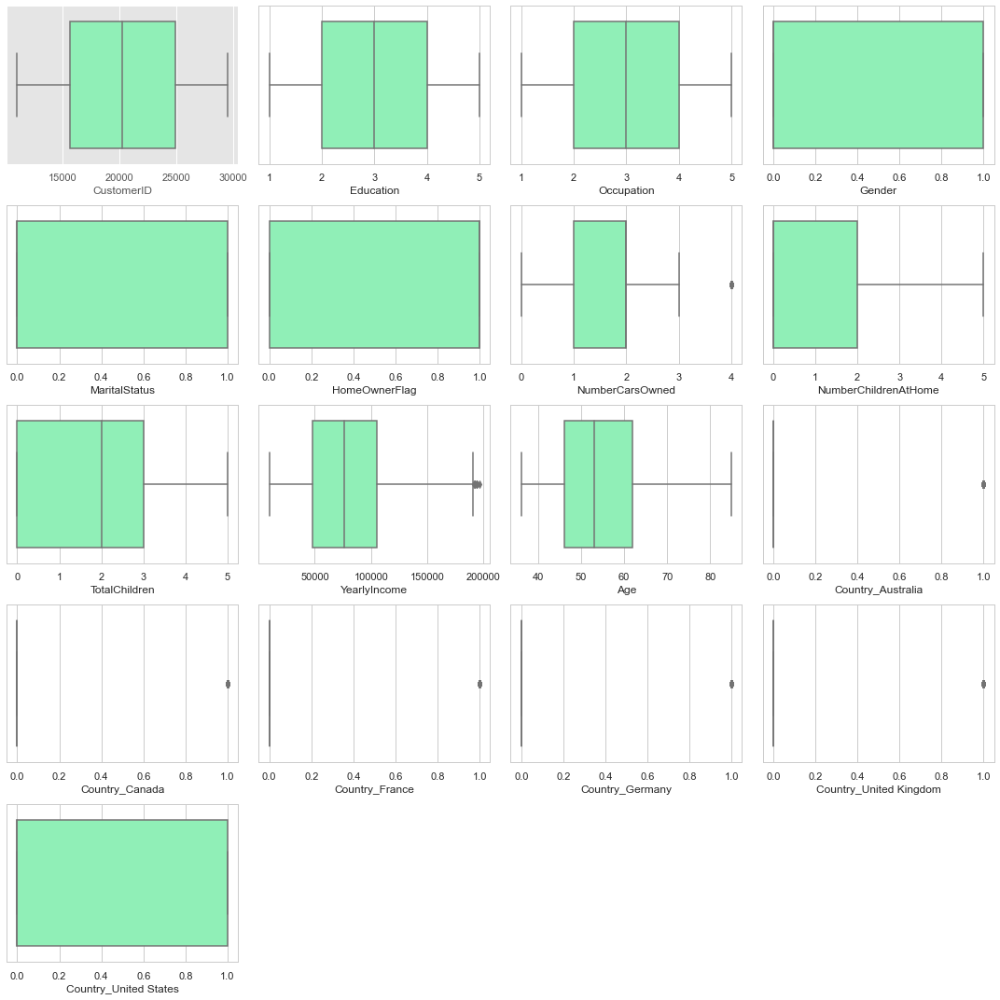

In [122]:
data_columns = cust._get_numeric_data().columns.values
plot_columns = (cust.shape[1])/5
number_of_columns = math.ceil(len(data_columns)/plot_columns)
number_of_rows = math.ceil((len(data_columns))/number_of_columns)

plt.figure(figsize=(15,15))
for i in range(0,len(data_columns)):
    plt.subplot(number_of_columns, number_of_rows, i+1)
    sns.set_style('whitegrid')
    sns.boxplot(cust[data_columns[i]],palette='rainbow',orient='v')
    plt.tight_layout()


### Check distributions

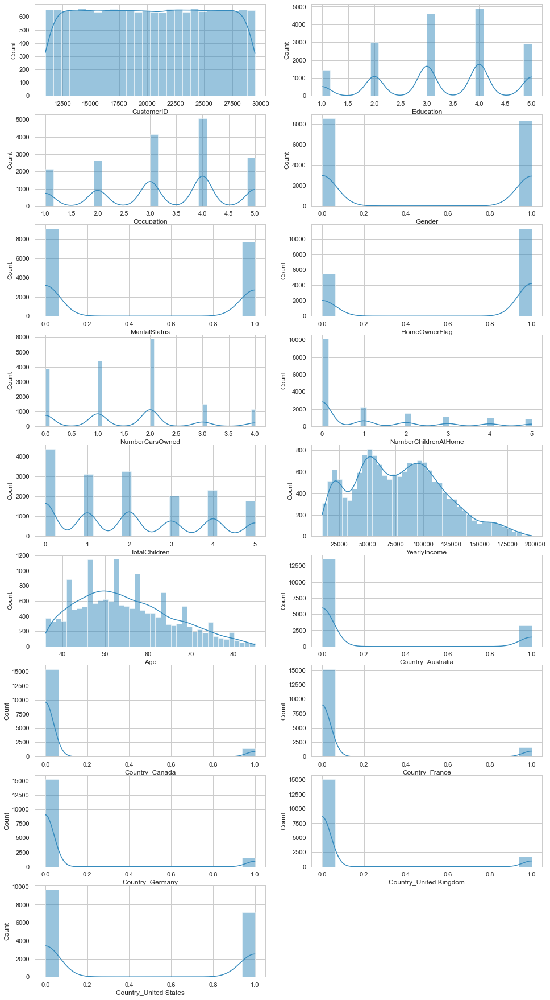

In [123]:
data_columns = cust._get_numeric_data().columns.values
plot_columns = 2
number_of_columns = math.ceil(len(data_columns)/plot_columns)
number_of_rows = math.ceil((len(data_columns))/number_of_columns)

plt.figure(figsize=(16,35))

# plot distribution
for i in range(0, len(data_columns)):
    plt.subplot(number_of_columns + 1, number_of_rows, i+1)
    sns.histplot(cust[data_columns[i]], kde=True) 


In [124]:
cust.skew()

CustomerID               -0.000715
Education                -0.257805
Occupation               -0.305058
Gender                    0.023642
MaritalStatus             0.160534
HomeOwnerFlag            -0.745894
NumberCarsOwned           0.401808
NumberChildrenAtHome      1.397916
TotalChildren             0.362371
YearlyIncome              0.353344
Age                       0.459823
Country_Australia         1.544168
Country_Canada            2.958943
Country_France            2.734171
Country_Germany           2.751595
Country_United Kingdom    2.607373
Country_United States     0.305606
dtype: float64

### Scaling

In [125]:
cust.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 16837 entries, 0 to 16920
Data columns (total 17 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   CustomerID              16837 non-null  int64  
 1   Education               16837 non-null  int64  
 2   Occupation              16837 non-null  int64  
 3   Gender                  16837 non-null  int64  
 4   MaritalStatus           16837 non-null  int64  
 5   HomeOwnerFlag           16837 non-null  int64  
 6   NumberCarsOwned         16837 non-null  int64  
 7   NumberChildrenAtHome    16837 non-null  int64  
 8   TotalChildren           16837 non-null  int64  
 9   YearlyIncome            16837 non-null  int64  
 10  Age                     16837 non-null  float64
 11  Country_Australia       16837 non-null  uint8  
 12  Country_Canada          16837 non-null  uint8  
 13  Country_France          16837 non-null  uint8  
 14  Country_Germany         16837 non-null

In [126]:
#originally numerical columns to scale

nums = cust[["Age", "YearlyIncome"]]
nums

,Age,YearlyIncome
0,51.0,137947
1,52.0,101141
2,51.0,91945
3,49.0,86688
4,48.0,92771
...,...,...
16916,48.0,97084
16917,67.0,110762
16918,79.0,138097
16919,60.0,101465


In [127]:
# scale the data

mmscaler = MinMaxScaler()

dfname = nums.columns
data_scaled = mmscaler.fit_transform(nums)
data_scaled = pd.DataFrame(data_scaled, columns=dfname)
data_scaled

,Age,YearlyIncome
0,0.306122,0.686872
1,0.326531,0.490079
2,0.306122,0.440910
3,0.265306,0.412802
4,0.244898,0.445327
...,...,...
16832,0.244898,0.468387
16833,0.632653,0.541520
16834,0.877551,0.687674
16835,0.489796,0.491811


In [128]:
nums.isnull().sum()

Age             0
YearlyIncome    0
dtype: int64

In [129]:
data_scaled.isnull().sum()

Age             0
YearlyIncome    0
dtype: int64

In [130]:
cust.head()

,CustomerID,Education,Occupation,Gender,MaritalStatus,HomeOwnerFlag,NumberCarsOwned,NumberChildrenAtHome,TotalChildren,YearlyIncome,Age,Country_Australia,Country_Canada,Country_France,Country_Germany,Country_United Kingdom,Country_United States
0,11000,4,4,0,0,1,0,0,2,137947,51.0,1,0,0,0,0,0
1,11001,4,4,0,1,0,1,3,3,101141,52.0,1,0,0,0,0,0
2,11002,4,4,0,0,1,1,3,3,91945,51.0,1,0,0,0,0,0
3,11003,4,4,1,1,0,1,0,0,86688,49.0,1,0,0,0,0,0
4,11004,4,4,1,1,1,4,5,5,92771,48.0,1,0,0,0,0,0


In [131]:
custprescale = cust.copy()

In [132]:
cust.drop(["CustomerID", "Age", "YearlyIncome"], axis=1, inplace=True)
cust.columns

Index(['Education', 'Occupation', 'Gender', 'MaritalStatus', 'HomeOwnerFlag',
       'NumberCarsOwned', 'NumberChildrenAtHome', 'TotalChildren',
       'Country_Australia', 'Country_Canada', 'Country_France',
       'Country_Germany', 'Country_United Kingdom', 'Country_United States'],
      dtype='object')

In [133]:
cust.shape

(16837, 14)

In [134]:
data_scaled.shape

(16837, 2)

In [135]:
cust.index = data_scaled.index

In [136]:
cust = pd.concat([cust, data_scaled], axis=1)


In [137]:
cust.shape

(16837, 16)

In [138]:
cust.head()

,Education,Occupation,Gender,MaritalStatus,HomeOwnerFlag,NumberCarsOwned,NumberChildrenAtHome,TotalChildren,Country_Australia,Country_Canada,Country_France,Country_Germany,Country_United Kingdom,Country_United States,Age,YearlyIncome
0,4,4,0,0,1,0,0,2,1,0,0,0,0,0,0.306122,0.686872
1,4,4,0,1,0,1,3,3,1,0,0,0,0,0,0.326531,0.490079
2,4,4,0,0,1,1,3,3,1,0,0,0,0,0,0.306122,0.440910
3,4,4,1,1,0,1,0,0,1,0,0,0,0,0,0.265306,0.412802
4,4,4,1,1,1,4,5,5,1,0,0,0,0,0,0.244898,0.445327


In [139]:
cust.isnull().sum()

Education                 0
Occupation                0
Gender                    0
MaritalStatus             0
HomeOwnerFlag             0
NumberCarsOwned           0
NumberChildrenAtHome      0
TotalChildren             0
Country_Australia         0
Country_Canada            0
Country_France            0
Country_Germany           0
Country_United Kingdom    0
Country_United States     0
Age                       0
YearlyIncome              0
dtype: int64

In [140]:
cust.index = custprescale.index
cust_scaled_withID = pd.concat([cust,custprescale["CustomerID"]], axis=1)
cust_scaled_withID

,Education,Occupation,Gender,MaritalStatus,HomeOwnerFlag,NumberCarsOwned,NumberChildrenAtHome,TotalChildren,Country_Australia,Country_Canada,Country_France,Country_Germany,Country_United Kingdom,Country_United States,Age,YearlyIncome,CustomerID
0,4,4,0,0,1,0,0,2,1,0,0,0,0,0,0.306122,0.686872,11000
1,4,4,0,1,0,1,3,3,1,0,0,0,0,0,0.326531,0.490079,11001
2,4,4,0,0,1,1,3,3,1,0,0,0,0,0,0.306122,0.440910,11002
3,4,4,1,1,0,1,0,0,1,0,0,0,0,0,0.265306,0.412802,11003
4,4,4,1,1,1,4,5,5,1,0,0,0,0,0,0.244898,0.445327,11004
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16916,5,3,1,1,0,0,0,0,0,0,0,0,1,0,0.244898,0.468387,24211
16917,3,5,1,1,0,4,4,4,0,0,0,1,0,0,0.632653,0.541520,23627
16918,4,5,1,1,0,4,3,3,0,0,0,0,0,1,0.877551,0.687674,14500
16919,3,4,1,0,1,1,0,2,0,0,0,0,0,1,0.489796,0.491811,22223


In [141]:
cust.shape

(16837, 16)

In [142]:
cust_scaled_withID.shape

(16837, 17)

In [143]:
cust_scaled_withID.to_csv("customers_scaled.csv")

In [144]:
cust_scaled_withID.duplicated().sum()

0

## KMeans

In [145]:
# prepare for the model
inertia = []

ks= range(1,20)

In [146]:
#get the best ks

for i in ks:
    kmeans2= KMeans(n_clusters=i, random_state=7)
    kmeans2.fit(cust)
    inertia.append(kmeans2.inertia_)

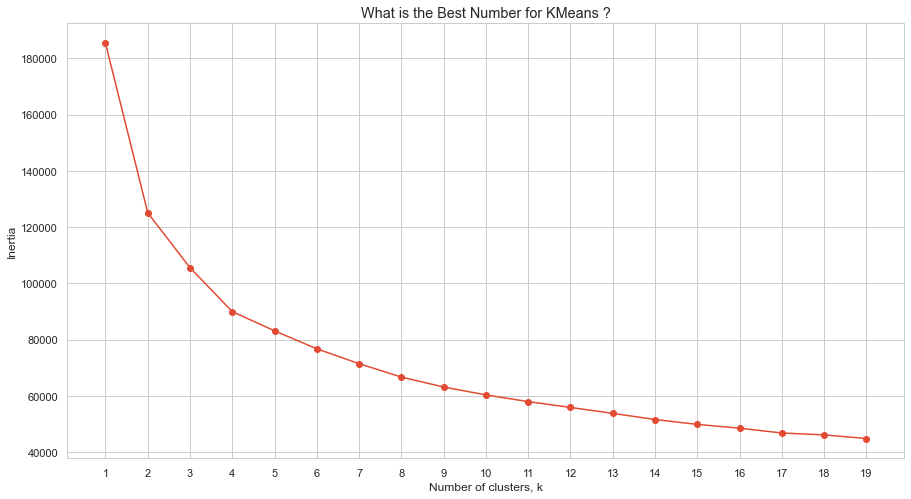

In [147]:
#plot ks vs inertias
f, ax = plt.subplots(figsize=(15, 8))
plt.plot(ks, inertia, '-o')

plt.xlabel('Number of clusters, k')
plt.ylabel('Inertia')
plt.xticks(ks)
plt.style.use('ggplot')
plt.title('What is the Best Number for KMeans ?')
plt.show()

In [148]:
# find elbow point 
kl = KneeLocator(ks, inertia, curve="convex", direction="decreasing")
kl

In [149]:
print("Elbow point: ", kl.elbow)

Elbow point:  4


In [150]:
# build the model with 4 clusters

kmeans2 = KMeans(n_clusters=4, max_iter=500, random_state=66)

kmeans2.fit(cust)

KMeans(max_iter=500, n_clusters=4, random_state=66)

In [151]:
cust.head()

,Education,Occupation,Gender,MaritalStatus,HomeOwnerFlag,NumberCarsOwned,NumberChildrenAtHome,TotalChildren,Country_Australia,Country_Canada,Country_France,Country_Germany,Country_United Kingdom,Country_United States,Age,YearlyIncome
0,4,4,0,0,1,0,0,2,1,0,0,0,0,0,0.306122,0.686872
1,4,4,0,1,0,1,3,3,1,0,0,0,0,0,0.326531,0.490079
2,4,4,0,0,1,1,3,3,1,0,0,0,0,0,0.306122,0.440910
3,4,4,1,1,0,1,0,0,1,0,0,0,0,0,0.265306,0.412802
4,4,4,1,1,1,4,5,5,1,0,0,0,0,0,0.244898,0.445327


In [152]:
custoriginal.head()

,CustomerID,CountryRegionName,Education,Occupation,Gender,MaritalStatus,HomeOwnerFlag,NumberCarsOwned,NumberChildrenAtHome,TotalChildren,YearlyIncome,Age
0,11000,Australia,Bachelors,Professional,M,M,1,0,0,2,137947,51.0
1,11001,Australia,Bachelors,Professional,M,S,0,1,3,3,101141,52.0
2,11002,Australia,Bachelors,Professional,M,M,1,1,3,3,91945,51.0
3,11003,Australia,Bachelors,Professional,F,S,0,1,0,0,86688,49.0
4,11004,Australia,Bachelors,Professional,F,S,1,4,5,5,92771,48.0


In [153]:
custKmeans = custoriginal.copy()

In [154]:
#assign the clusters IDs to the original data
custKmeans["ClusterID"] = kmeans2.labels_
custKmeans

,CustomerID,CountryRegionName,Education,Occupation,Gender,MaritalStatus,HomeOwnerFlag,NumberCarsOwned,NumberChildrenAtHome,TotalChildren,YearlyIncome,Age,ClusterID
0,11000,Australia,Bachelors,Professional,M,M,1,0,0,2,137947,51.0,0
1,11001,Australia,Bachelors,Professional,M,S,0,1,3,3,101141,52.0,1
2,11002,Australia,Bachelors,Professional,M,M,1,1,3,3,91945,51.0,1
3,11003,Australia,Bachelors,Professional,F,S,0,1,0,0,86688,49.0,0
4,11004,Australia,Bachelors,Professional,F,S,1,4,5,5,92771,48.0,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...
16916,24211,United Kingdom,Graduate Degree,Skilled Manual,F,S,0,0,0,0,97084,48.0,0
16917,23627,Germany,Partial College,Management,F,S,0,4,4,4,110762,67.0,3
16918,14500,United States,Bachelors,Management,F,S,0,4,3,3,138097,79.0,3
16919,22223,United States,Partial College,Professional,F,M,1,1,0,2,101465,60.0,1


In [155]:
custKmeans["ClusterID"].value_counts()

0    5364
1    4420
2    4399
3    2654
Name: ClusterID, dtype: int64

In [156]:
custKmeans.to_csv("KMeansClusters.csv")

## Visualising the clusters

In [157]:
custKmeans.columns

Index(['CustomerID', 'CountryRegionName', 'Education', 'Occupation', 'Gender',
       'MaritalStatus', 'HomeOwnerFlag', 'NumberCarsOwned',
       'NumberChildrenAtHome', 'TotalChildren', 'YearlyIncome', 'Age',
       'ClusterID'],
      dtype='object')

### Bar plots

In [158]:
#calculate means per cluster
mean_clusters2 = custKmeans.groupby("ClusterID").mean().reset_index()
mean_clusters2

,ClusterID,CustomerID,HomeOwnerFlag,NumberCarsOwned,NumberChildrenAtHome,TotalChildren,YearlyIncome,Age
0,0,20158.640194,0.677852,0.805183,0.137397,0.604027,80507.435123,49.566928
1,1,20108.226018,0.738914,1.678507,0.792308,3.214253,93836.019457,63.628054
2,2,20663.240055,0.547397,1.418050,0.447602,1.161173,39097.579905,51.852239
3,3,19915.155237,0.772419,2.764130,4.010173,4.239638,113476.219292,55.340241


In [159]:
fig = px.bar(mean_clusters2, x="ClusterID", y="Age",
            color="ClusterID", color_continuous_scale=colors)
fig.update_layout(barmode="group")
fig.show()

In [160]:
fig = px.bar(mean_clusters2, x="ClusterID", y="YearlyIncome",
            color="ClusterID", color_continuous_scale=colors)
fig.update_layout(barmode="group")
fig.show()

In [161]:
fig = px.bar(mean_clusters2, x="ClusterID", y="TotalChildren",
            color="ClusterID", color_continuous_scale=colors)
fig.update_layout(barmode="group")
fig.show()

In [162]:
fig = px.bar(mean_clusters2, x="ClusterID", y="NumberChildrenAtHome",
            color="ClusterID", color_continuous_scale=colors)
fig.update_layout(barmode="group")
fig.show()

In [163]:
fig = px.bar(mean_clusters2, x="ClusterID", y="NumberCarsOwned",
            color="ClusterID", color_continuous_scale=colors)
fig.update_layout(barmode="group")
fig.show()

In [164]:
fig = px.bar(mean_clusters2, x="ClusterID", y="HomeOwnerFlag",
            color="ClusterID", color_continuous_scale=colors)
fig.update_layout(barmode="group")
fig.show()

In [165]:
cust

,Education,Occupation,Gender,MaritalStatus,HomeOwnerFlag,NumberCarsOwned,NumberChildrenAtHome,TotalChildren,Country_Australia,Country_Canada,Country_France,Country_Germany,Country_United Kingdom,Country_United States,Age,YearlyIncome
0,4,4,0,0,1,0,0,2,1,0,0,0,0,0,0.306122,0.686872
1,4,4,0,1,0,1,3,3,1,0,0,0,0,0,0.326531,0.490079
2,4,4,0,0,1,1,3,3,1,0,0,0,0,0,0.306122,0.440910
3,4,4,1,1,0,1,0,0,1,0,0,0,0,0,0.265306,0.412802
4,4,4,1,1,1,4,5,5,1,0,0,0,0,0,0.244898,0.445327
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16916,5,3,1,1,0,0,0,0,0,0,0,0,1,0,0.244898,0.468387
16917,3,5,1,1,0,4,4,4,0,0,0,1,0,0,0.632653,0.541520
16918,4,5,1,1,0,4,3,3,0,0,0,0,0,1,0.877551,0.687674
16919,3,4,1,0,1,1,0,2,0,0,0,0,0,1,0.489796,0.491811


In [166]:
cust_scaled_Kmeans = cust.copy()

In [167]:
#assign the clusters IDs to the scaled data
cust_scaled_Kmeans["ClusterID"] = kmeans2.labels_
cust_scaled_Kmeans

,Education,Occupation,Gender,MaritalStatus,HomeOwnerFlag,NumberCarsOwned,NumberChildrenAtHome,TotalChildren,Country_Australia,Country_Canada,Country_France,Country_Germany,Country_United Kingdom,Country_United States,Age,YearlyIncome,ClusterID
0,4,4,0,0,1,0,0,2,1,0,0,0,0,0,0.306122,0.686872,0
1,4,4,0,1,0,1,3,3,1,0,0,0,0,0,0.326531,0.490079,1
2,4,4,0,0,1,1,3,3,1,0,0,0,0,0,0.306122,0.440910,1
3,4,4,1,1,0,1,0,0,1,0,0,0,0,0,0.265306,0.412802,0
4,4,4,1,1,1,4,5,5,1,0,0,0,0,0,0.244898,0.445327,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16916,5,3,1,1,0,0,0,0,0,0,0,0,1,0,0.244898,0.468387,0
16917,3,5,1,1,0,4,4,4,0,0,0,1,0,0,0.632653,0.541520,3
16918,4,5,1,1,0,4,3,3,0,0,0,0,0,1,0.877551,0.687674,3
16919,3,4,1,0,1,1,0,2,0,0,0,0,0,1,0.489796,0.491811,1


In [168]:
#calculate count split for marital status
marital = custKmeans.groupby(["ClusterID","MaritalStatus"]).count()["CustomerID"].reset_index()
marital

,ClusterID,MaritalStatus,CustomerID
0,0,M,2919
1,0,S,2445
2,1,M,2758
3,1,S,1662
4,2,M,1715
5,2,S,2684
6,3,M,1700
7,3,S,954


In [169]:
marital.rename(columns={"CustomerID":"Number of Customers"}, inplace=True)
marital

,ClusterID,MaritalStatus,Number of Customers
0,0,M,2919
1,0,S,2445
2,1,M,2758
3,1,S,1662
4,2,M,1715
5,2,S,2684
6,3,M,1700
7,3,S,954


In [170]:
fig = px.bar(marital, x= 'ClusterID', y= 'Number of Customers', 
             color='MaritalStatus', color_discrete_sequence= [ 'gold', 'coral'])
fig.show()


In [171]:
#calculate count split for gender
gender = custKmeans.groupby(["ClusterID","Gender"]).count()["CustomerID"].reset_index()
gender.rename(columns={"CustomerID":"Number of Customers"}, inplace=True)

fig = px.bar(gender, x= 'ClusterID', y= 'Number of Customers', 
             color='Gender', color_discrete_sequence= [ 'gold', 'coral'])
fig.show()

In [172]:
cust.Occupation.nunique()

5

In [173]:
#calculate count split for occupation
occ = custKmeans.groupby(["ClusterID","Occupation"]).count()["CustomerID"].reset_index()
occ.rename(columns={"CustomerID":"Number of Customers"}, inplace=True)

fig = px.bar(occ, x= 'ClusterID', y= 'Number of Customers', 
             color='Occupation', color_discrete_sequence= [ 'gold', 'coral', 'green', 'blue', 'purple'])
fig.show()

In [174]:
cust.Education.nunique()

5

In [175]:
#calculate count split for education
edu = custKmeans.groupby(["ClusterID","Education"]).count()["CustomerID"].reset_index()
edu.rename(columns={"CustomerID":"Number of Customers"}, inplace=True)

fig = px.bar(edu, x= 'ClusterID', y= 'Number of Customers', 
             color='Education', color_discrete_sequence= [ 'gold', 'coral', 'green', 'blue', 'purple'])
fig.show()

In [176]:
custKmeans.CountryRegionName.nunique()

6

In [177]:
#calculate count split for location
loc = custKmeans.groupby(["ClusterID","CountryRegionName"]).count()["CustomerID"].reset_index()
loc.rename(columns={"CustomerID":"Number of Customers"}, inplace=True)

fig = px.bar(loc, x= 'ClusterID', y= 'Number of Customers', 
             color='CountryRegionName', color_discrete_sequence= [ 'gold', 'coral', 'olive', 'blue', 'purple', 'seagreen'])
fig.show()

### Scatter plots

In [178]:
colors = ["Coral", "gold", "DarkSeaGreen", "Olive"]

In [179]:
#Income vs Total children

fig = px.scatter(custKmeans, x="YearlyIncome", y="TotalChildren", 
                 color="ClusterID", color_continuous_scale=colors)
fig.update_layout(coloraxis_showscale=False)
fig.show()

In [180]:
#Income vs children at home

fig = px.scatter(custKmeans, x="YearlyIncome", y="NumberChildrenAtHome", 
                 color="ClusterID", color_continuous_scale=colors)
fig.update_layout(coloraxis_showscale=False)
fig.show()

In [181]:
#total children vs children at home

fig = px.scatter(custKmeans, x="TotalChildren", y="NumberChildrenAtHome", 
                 color="ClusterID", color_continuous_scale=colors)
fig.update_layout(coloraxis_showscale=False)
fig.show()

# Comparing the clusters

In [205]:
custKmeans

,CustomerID,CountryRegionName,Education,Occupation,Gender,MaritalStatus,HomeOwnerFlag,NumberCarsOwned,NumberChildrenAtHome,TotalChildren,YearlyIncome,Age,ClusterID
0,11000,Australia,Bachelors,Professional,M,M,1,0,0,2,137947,51.0,0
1,11001,Australia,Bachelors,Professional,M,S,0,1,3,3,101141,52.0,1
2,11002,Australia,Bachelors,Professional,M,M,1,1,3,3,91945,51.0,1
3,11003,Australia,Bachelors,Professional,F,S,0,1,0,0,86688,49.0,0
4,11004,Australia,Bachelors,Professional,F,S,1,4,5,5,92771,48.0,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...
16916,24211,United Kingdom,Graduate Degree,Skilled Manual,F,S,0,0,0,0,97084,48.0,0
16917,23627,Germany,Partial College,Management,F,S,0,4,4,4,110762,67.0,3
16918,14500,United States,Bachelors,Management,F,S,0,4,3,3,138097,79.0,3
16919,22223,United States,Partial College,Professional,F,M,1,1,0,2,101465,60.0,1


In [210]:
RFM

,CustomerKey,Recency,Frequency,Monetary,ClusterID
0,19331,0,2,28.98,2
1,11877,0,2,58.85,2
2,22726,0,1,59.98,2
3,15615,0,7,96.49,2
4,22202,0,6,4426.48,0
...,...,...,...,...,...
17411,29140,906,1,3578.27,3
17412,29151,908,1,3578.27,3
17413,29170,909,1,3578.27,3
17414,29143,910,1,3578.27,3


In [214]:
allclusters = RFM.copy()

In [215]:
allclusters.rename(columns={"ClusterID":"RFM Cluster", "CustomerKey":"CustomerID"}, inplace=True)

In [216]:
allclusters

,CustomerID,Recency,Frequency,Monetary,RFM Cluster
0,19331,0,2,28.98,2
1,11877,0,2,58.85,2
2,22726,0,1,59.98,2
3,15615,0,7,96.49,2
4,22202,0,6,4426.48,0
...,...,...,...,...,...
17411,29140,906,1,3578.27,3
17412,29151,908,1,3578.27,3
17413,29170,909,1,3578.27,3
17414,29143,910,1,3578.27,3


In [217]:
allclusters = pd.merge(allclusters, custKmeans[["CustomerID","ClusterID"]], on="CustomerID", how="left")
allclusters

,CustomerID,Recency,Frequency,Monetary,RFM Cluster,ClusterID
0,19331,0,2,28.98,2,2.0
1,11877,0,2,58.85,2,0.0
2,22726,0,1,59.98,2,1.0
3,15615,0,7,96.49,2,2.0
4,22202,0,6,4426.48,0,1.0
...,...,...,...,...,...,...
17430,29140,906,1,3578.27,3,1.0
17431,29151,908,1,3578.27,3,0.0
17432,29170,909,1,3578.27,3,0.0
17433,29143,910,1,3578.27,3,0.0


In [218]:
allclusters.rename(columns={"ClusterID":"Demographic Cluster"}, inplace=True)

In [219]:
allclusters

,CustomerID,Recency,Frequency,Monetary,RFM Cluster,Demographic Cluster
0,19331,0,2,28.98,2,2.0
1,11877,0,2,58.85,2,0.0
2,22726,0,1,59.98,2,1.0
3,15615,0,7,96.49,2,2.0
4,22202,0,6,4426.48,0,1.0
...,...,...,...,...,...,...
17430,29140,906,1,3578.27,3,1.0
17431,29151,908,1,3578.27,3,0.0
17432,29170,909,1,3578.27,3,0.0
17433,29143,910,1,3578.27,3,0.0


In [221]:
cluster_compare = allclusters.groupby(["RFM Cluster", "Demographic Cluster"]).count()["CustomerID"].reset_index()
cluster_compare

,RFM Cluster,Demographic Cluster,CustomerID
0,0,0.0,953
1,0,1.0,570
2,0,2.0,517
3,0,3.0,321
4,1,0.0,1327
5,1,1.0,1592
6,1,2.0,1736
7,1,3.0,1108
8,2,0.0,466
9,2,1.0,543


In [222]:
cluster_compare.rename(columns={"CustomerID":"Number of Customers"}, inplace=True)
cluster_compare

,RFM Cluster,Demographic Cluster,Number of Customers
0,0,0.0,953
1,0,1.0,570
2,0,2.0,517
3,0,3.0,321
4,1,0.0,1327
5,1,1.0,1592
6,1,2.0,1736
7,1,3.0,1108
8,2,0.0,466
9,2,1.0,543


In [223]:
fig = px.bar(cluster_compare, x= 'RFM Cluster', y= 'Number of Customers', 
             color='Demographic Cluster', color_discrete_sequence= [ 'black', 'green'])
fig.show()


In [225]:
cluster_compare2 = allclusters.groupby(["Demographic Cluster", "RFM Cluster"]).count()["CustomerID"].reset_index()
cluster_compare2.rename(columns={"CustomerID":"Number of Customers"}, inplace=True)
cluster_compare2

,Demographic Cluster,RFM Cluster,Number of Customers
0,0.0,0,953
1,0.0,1,1327
2,0.0,2,466
3,0.0,3,2337
4,1.0,0,570
5,1.0,1,1592
6,1.0,2,543
7,1.0,3,1441
8,2.0,0,517
9,2.0,1,1736


In [226]:
fig = px.bar(cluster_compare2, x= 'Demographic Cluster', y= 'Number of Customers', 
             color='RFM Cluster', color_discrete_sequence= [ 'black', 'green'])
fig.show()


# Conclusions

In [229]:
RFM.ClusterID.value_counts()

1    6362
3    6328
0    2571
2    2155
Name: ClusterID, dtype: int64

In [227]:
cluster_compare2

,Demographic Cluster,RFM Cluster,Number of Customers
0,0.0,0,953
1,0.0,1,1327
2,0.0,2,466
3,0.0,3,2337
4,1.0,0,570
5,1.0,1,1592
6,1.0,2,543
7,1.0,3,1441
8,2.0,0,517
9,2.0,1,1736


In [230]:
cluster_compare

,RFM Cluster,Demographic Cluster,Number of Customers
0,0,0.0,953
1,0,1.0,570
2,0,2.0,517
3,0,3.0,321
4,1,0.0,1327
5,1,1.0,1592
6,1,2.0,1736
7,1,3.0,1108
8,2,0.0,466
9,2,1.0,543


In [231]:
#people in rfm cluster 2 and in demo clusters 0 and 1
466+543

1009

In [232]:
#people in rfm cluster 3 and in demo clusters 0 and 1
2337 + 1441

3778